### Import packages

In [ ]:
from transformers import AutoImageProcessor, AutoModelForImageClassification
import torch
import numpy as np
import os
from tqdm import tqdm
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision import transforms
from datasets import load_dataset,DatasetDict,load_from_disk
from torch.utils.data import DataLoader
import torch.nn.functional as F
from itertools import islice
import copy
from torchmetrics.retrieval import RetrievalMAP, RetrievalPrecision
import os
import random
import torch
import torch.nn.functional as F
import torch.nn as nn



### Set seed

In [2]:
torch.manual_seed(0)

### Set device

In [3]:
if torch.cuda.is_available():
    device = 'cuda'
elif torch.backends.mps.is_available():
    device = 'mps'
else:
    device = 'cpu'
    
device

'mps'

### Define main path

In [4]:
main_path = '/Users/aakashagarwal/Downloads/ir_assignment2/'

### Dataset

#### Load dataset

In [5]:
ds = load_dataset("uoft-cs/cifar10")
ds

DatasetDict({
    train: Dataset({
        features: ['img', 'label'],
        num_rows: 50000
    })
    test: Dataset({
        features: ['img', 'label'],
        num_rows: 10000
    })
})

### Model load

In [6]:
processor = AutoImageProcessor.from_pretrained("google/vit-large-patch32-384",use_fast=True)
model = AutoModelForImageClassification.from_pretrained("google/vit-large-patch32-384")
model.to(device)
print()

### Extract features of training data

#### Feature function

#### Create features of train data or load from saved file.

In [7]:
model.eval()

transform = transforms.Compose([
        transforms.Resize((384, 384)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

# Define a function to process and extract features from each image
def extract_features(batch):
    imgs = batch['img']  # This will now be a list of images in a batch

    # Preprocess each image in the batch
    img_tensors = [transform(img).unsqueeze(0).to(device) for img in imgs]  # Add batch dimension and move to device
    img_tensors = torch.cat(img_tensors, dim=0)  # Concatenate to create a batch tensor

    inputs = {'pixel_values': img_tensors}  # Adjust for model input (assuming using Hugging Face models)

    # Forward pass through the model to get features
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)

    hidden_states = outputs.hidden_states  # List of all hidden states

    # Extract the final hidden state
    final_hidden_state = hidden_states[-1]  # Shape: [batch_size, num_patches, hidden_size]
    
    # Optionally, pool the features
    pooled_features = final_hidden_state.mean(dim=1)  # Shape: [batch_size, hidden_size]
    
    # Return the features as a new column for the batch
    return {"features": pooled_features.cpu().numpy()}  # 


In [8]:

output_dir = main_path+ "features/cifar10/"
os.makedirs(output_dir, exist_ok=True)
output_file = os.path.join(output_dir, "vit_large/")  # Saving in Arrow format

# Check if features already exist
if os.path.exists(output_file):
    print(f"Features file already exists at {output_file}. Loading features...")
    # Load existing features
    ds_feature = load_from_disk(output_file)
else:
    print("Features file does not exist. Extracting features...")

    # Use `map` to apply the feature extraction across the entire dataset
    ds_feature = ds.map(extract_features, batched=True, batch_size=64)

    # Save the dataset with the new features to disk
    ds_feature.save_to_disk(output_file)  # Saving in the Arrow format
    print("Features saved successfully!")

Features file already exists at /Users/aakashagarwal/Downloads/ir_assignment2/features/cifar10/vit_large/. Loading features...


In [9]:
ds_feature

DatasetDict({
    train: Dataset({
        features: ['img', 'label', 'features'],
        num_rows: 50000
    })
    test: Dataset({
        features: ['img', 'label', 'features'],
        num_rows: 10000
    })
})

#### adding index to dataset

In [10]:
dataset_dict = DatasetDict({
    'train': ds_feature['train'],  # Your original train dataset
    'test': ds_feature['test']     # Your original test dataset
})

# Add index column to the train and test datasets
def add_index(example, idx):
    example['index'] = idx
    return example

# Apply the map function to add the 'index' column
ds_feature['train'] = dataset_dict['train'].map(add_index, with_indices=True)
ds_feature['test'] = dataset_dict['test'].map(add_index, with_indices=True)

In [11]:
ds_feature['test'][27]['index']

27

### Dataloader

#### Collate function

In [12]:
def custom_collate(batch):
    # Define the transformations you want to apply to the images
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
    ])

    # Extracting each field from the batch
    index = [item['index'] for item in batch]
    images = [transform(item['img']) for item in batch]  # Load and transform images
    labels = torch.tensor([item['label'] for item in batch])          # Convert labels to a tensor
    features = [torch.tensor(item['features']) for item in batch]     # Convert features to tensors
    
    # Return a dictionary with batched data
    return {
        'index': index,
        'img': torch.stack(images),    # Stack image tensors into a single tensor
        'label': labels,
        'features': torch.stack(features),  # Stack feature tensors into a single tensor
    }


In [13]:
def random_collate(batch):
    # Define the transformations you want to apply to the images
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize images to a consistent size
        transforms.ToTensor(),           # Convert PIL images to tensors
    ])

    # Extracting each field from the batch
    index = [item['index'] for item in batch]
    images = [transform(item['img']) for item in batch]  # Load and transform images
    labels = torch.tensor([item['label'] for item in batch])          # Convert labels to a tensor
    features = [torch.tensor(item['features']) for item in batch]     # Convert features to tensors
    
    # Return a dictionary with batched data
    return {
        'index': index,
        'img': torch.stack(images),    # Stack image tensors into a single tensor
        'label': labels,
        'features': torch.stack(features),  # Stack feature tensors into a single tensor
    }



In [154]:
cosine_similarities = []
train_features = torch.tensor(ds_feature['train']['features'])
batch_size = 64

In [ ]:
for i in tqdm(range(0, len(ds_feature['test']), batch_size)):
    # Get the batch of test features
    test_batch = torch.tensor(ds_feature['test']['features'][i:i+batch_size])
    
    # Normalize the test features in the current batch
    test_batch = test_batch / test_batch.norm(dim=1, keepdim=True)
    
    # Compute the cosine similarity between the current test batch and all train features
    batch_cosine_similarity = torch.matmul(test_batch, train_features.T)
    
    # Append the batch results to the list
    cosine_similarities.append(batch_cosine_similarity)

In [170]:
len(cosine_similarities[2])

64

In [162]:
# Define a function to assign cosine similarities to each test batch
def add_cosine_similarities(example, idx):
    # Calculate the batch index and the specific position within that batch
    batch_idx = idx // batch_size
    position_in_batch = idx % batch_size
    
    # Get the corresponding batch of cosine similarities
    cosine_batch = cosine_similarities[batch_idx]
    
    # Assign the precomputed cosine similarity from the batch
    example['cosine_similarities'] = cosine_batch[position_in_batch].tolist()
    return example

# Apply the function to each test sample, using with_indices to track batch position
ds_feature['test'] = ds_feature['test'].map(add_cosine_similarities, with_indices=True)

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]

In [172]:
ds_feature['test'][0]['cosine_similarities']

[65.89868927001953,
 72.83563232421875,
 57.12662887573242,
 63.675270080566406,
 65.11840057373047,
 82.40367126464844,
 65.1063461303711,
 60.29841995239258,
 65.0276107788086,
 60.032386779785156,
 94.18742370605469,
 58.4787483215332,
 83.55937194824219,
 45.2889289855957,
 75.71871948242188,
 156.68862915039062,
 78.15933227539062,
 94.6735610961914,
 50.50044250488281,
 60.334388732910156,
 52.75950241088867,
 54.5290412902832,
 153.84725952148438,
 55.7559700012207,
 61.82262420654297,
 64.54080963134766,
 44.0179443359375,
 52.84331512451172,
 77.78759765625,
 56.983524322509766,
 66.4950942993164,
 106.5352783203125,
 59.67385482788086,
 79.97450256347656,
 62.040382385253906,
 46.20603561401367,
 52.800811767578125,
 69.30882263183594,
 47.731483459472656,
 67.06192779541016,
 71.7257080078125,
 81.04815673828125,
 83.3649673461914,
 58.96343994140625,
 61.95215606689453,
 53.91883850097656,
 73.61273956298828,
 55.307979583740234,
 36.73036193847656,
 74.19712829589844,
 47.

#### Dataloading


In [14]:
train_dataloader = DataLoader(ds_feature['train'], batch_size=64, shuffle=True,collate_fn=custom_collate)
test_dataloader = DataLoader(ds_feature['test'], batch_size=64, shuffle=True,collate_fn=custom_collate)

In [15]:
for i,batch in enumerate(test_dataloader):
    if i ==19:
        print(batch['index'])
        break

[9231, 6021, 2496, 1736, 9028, 8827, 4939, 5268, 112, 4938, 4719, 3451, 2875, 1054, 2644, 1663, 4572, 8184, 5763, 5718, 7078, 6784, 1103, 5866, 7215, 5649, 4066, 3255, 4792, 5295, 3647, 3915, 5539, 548, 1503, 8277, 8799, 2139, 497, 1831, 1114, 4421, 46, 1706, 1547, 441, 3102, 5324, 8065, 200, 2865, 8, 1355, 5755, 5638, 8804, 3553, 3731, 3542, 4973, 740, 1538, 8960, 8832]


#### Dataloader to random a random batch, shuffle=True

In [16]:
random_train_dataloader = DataLoader(
    ds_feature['train'], batch_size=64, shuffle=True, collate_fn=random_collate, pin_memory=True
)

### Get radom batch to sample negatives

In [17]:
from torch.utils.data import DataLoader

def get_random_batch():
    random_train_dataloader = DataLoader(
        ds_feature['train'], batch_size=64, shuffle=True, collate_fn=custom_collate, pin_memory=True
    )
    # Get the first batch from the DataLoader
    first_batch = next(iter(random_train_dataloader))
    return first_batch

### HashNetwok Model

In [18]:
import torch
import torch.nn as nn

class HashNetwork(nn.Module):
    def __init__(self, input_dim, hash_bits):
        super(HashNetwork, self).__init__()
        
        # Define the hashing network layers
        self.hashing_network = nn.Sequential(
            nn.Linear(input_dim, input_dim, bias=True),
            nn.ReLU(),
            nn.Dropout(0.3),  # Increased dropout rate for regularization
            nn.Linear(input_dim, input_dim // 2, bias=True),
            nn.ReLU(),
            nn.Linear(input_dim // 2, input_dim // 4, bias=True),
            nn.ReLU(),
            nn.Linear(input_dim // 4, hash_bits, bias=True),
            nn.Tanh()
        )
        
        # Initialize the loss coefficients as a learnable parameter
        self.loss_coefficients = nn.Parameter(torch.FloatTensor(3))
        nn.init.uniform_(self.loss_coefficients, 0.01, 0.1)  # Use uniform initialization for loss coefficients

        # Initialize network weights using Xavier initialization
        self._initialize_weights()

    def _initialize_weights(self):
        for module in self.hashing_network:
            if isinstance(module, nn.Linear):
                nn.init.xavier_uniform_(module.weight)  # Apply Xavier initialization to weights
                if module.bias is not None:
                    nn.init.zeros_(module.bias)  # Initialize biases to zero

        # Normalize the loss coefficients to ensure they sum to 1 initially
        self.loss_coefficients.data /= self.loss_coefficients.data.sum()

    def forward(self, x):
        return self.hashing_network(x)

    def get_loss_coefficients(self):
        # Apply softmax to ensure they sum to 1
        return nn.functional.softmax(self.loss_coefficients, dim=0)

    def clamp_and_normalize_loss_coefficients(self, min_value=0.01):
        # Clamp the coefficients to be at least `min_value`
        self.loss_coefficients.data = torch.clamp(self.loss_coefficients.data, min=min_value)
        
        # Normalize the coefficients to sum to 1
        self.loss_coefficients.data /= torch.sum(self.loss_coefficients.data)



### Loss

In [71]:
def custom_loss_function(model, batch_features, batch_labels, random_batch_features, random_batch_labels, 
                         use_hyperparameter=True, alpha=0.01, beta=0.01, gamma=0.98):
    # Forward pass: Get hash codes from model
    batch_size = len(batch_labels)
    hash_codes = model(batch_features.to(device))  # shape: (batch_size, output_dim)
    random_hash_codes = model(random_batch_features.to(device))
    
    # 1. Bit balance term
    balance_loss = torch.mean(torch.abs(torch.sum(hash_codes, dim=1)))
    
    # 2. No sitting on the fence term
    # print(torch.abs(hash_codes))
    # print("###############")
    # print(torch.abs(hash_codes) - 1)
    # print("######################")
    # print(torch.norm(torch.abs(hash_codes) - 1, p=1, dim=1))
    fence_loss = torch.mean(torch.sum(torch.abs(torch.abs(hash_codes) - 1),dim=1))
    # fence_loss= torch.mean(torch.norm(torch.abs(hash_codes) - 1, p=1, dim=1))  # Apply the L1 norm


     
    # Create lists to store negative pairs
    negative_pairs = []
    for i in range(batch_size):
        for j in range(batch_size):
            if batch_labels[i] != random_batch_labels[j]:
                similarity = torch.nn.functional.cosine_similarity(
                    hash_codes[i].unsqueeze(0), random_hash_codes[j].unsqueeze(0))
                negative_pairs.append((i, j, similarity.item()))

    negative_pairs = sorted(negative_pairs, key=lambda x: x[2])
    # negative_pairs = negative_pairs[:5]  # take top 16 negative pairs
    
    
    weak_supervision_loss = 0
    # Calculate the loss for sampled negative pairs
    if negative_pairs:
        weak_supervision_loss = torch.sum(
            torch.stack([torch.abs(torch.dot(hash_codes[u], hash_codes[v])) for u, v, _ in negative_pairs])
        ) / len(negative_pairs)
    
    # Get loss coefficients
    if use_hyperparameter:
        gamma = 1 - alpha - beta
    else:
        alpha, beta, gamma = model.get_loss_coefficients()

    # Calculate total loss
    total_loss = alpha * balance_loss + beta * fence_loss + gamma * weak_supervision_loss
    
    return total_loss, balance_loss, fence_loss, weak_supervision_loss


### Training Loop

In [72]:

def train_model(model, dataloader, optimizer, use_hyperparameter,alpha, beta, gamma,num_epochs=10, save_interval=10):
    model.train()  # set model to training mode
    model.to(device)
    for epoch in range(num_epochs):
        running_loss = 0.0
        
        # Create a progress bar for the current epoch
        progress_bar = tqdm(dataloader, desc=f"Epoch [{epoch + 1}/{num_epochs}]", leave=False)
        
        for idx, batch in enumerate(progress_bar):
            batch_features = batch['features'].to(device)  # features from your dataset
            batch_labels = batch['label'].to(device)  # labels for the images
            # Random batch
            random_batch = get_random_batch()
            random_batch_features, random_batch_labels = random_batch['features'],random_batch['label']
            
            
            optimizer.zero_grad()

            # Calculate your custom loss
            loss, balance_loss, fence_loss, weak_supervision_loss = custom_loss_function(model, batch_features, batch_labels, random_batch_features, random_batch_labels,use_hyperparameter, alpha, beta, gamma)

            # Backward pass
            loss.backward()
            optimizer.step()

            # Clamp and normalize loss coefficients
            model.clamp_and_normalize_loss_coefficients(min_value=0.01)

            # Track running loss
            running_loss += loss.item()
            
            # Update progress bar with loss values
            progress_bar.set_postfix({
                'loss': loss.item(),
                'balance_loss': balance_loss.item(),
                'fence_loss': fence_loss.item(),
                'weak_loss': weak_supervision_loss.item()
            })
        
        # Average loss per epoch
        epoch_loss = running_loss / len(dataloader)
        print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {epoch_loss:.4f}")

        # Save the model every `save_interval` epochs
        if (epoch + 1) % save_interval == 0:
            model_save_path = f"cifar10_neural_lsh_1_epoch_{epoch + 1}.pth"
            torch.save(model.state_dict(), model_save_path)
            print(f"Model saved at {model_save_path}")




In [73]:
device = 'cpu'

#### Hyper Parameters

In [111]:
input_dim = 1024  # Example input dimension
hash_bits = 8   # Example number of hash bits
alpha=0.1
beta=0.1
gamma=1- alpha- beta
# Instantiate the model
model = HashNetwork(input_dim=input_dim, hash_bits=hash_bits).to(device)

# Define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.00001, weight_decay=1e-4)

#### Load model weights

In [114]:
# Specify the path to the saved model
model = HashNetwork(input_dim=input_dim, hash_bits=hash_bits).to(device)

model_load_path = "cifar10_neural_lsh_1_epoch_7.pt"

state_dict = torch.load(model_load_path, map_location=torch.device('cpu'))



/var/folders/9x/cvl5gvjj3v31p6kyd5_lblgh0000gn/T/ipykernel_45932/1396388858.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_load_path, map_

#### Start Training model

In [113]:
train_model(model, train_dataloader, optimizer, num_epochs=20,use_hyperparameter=True, alpha=alpha, beta=beta, gamma=gamma)

Epoch [1/20], Loss: 3.7157


KeyboardInterrupt: 

In [90]:
model_save_path = f"cifar10_neural_lsh_1_epoch_{7}.pt"
torch.save(model, model_save_path)
print(f"Model saved at {model_save_path}")

Model saved at cifar10_neural_lsh_1_epoch_7.pt


In [67]:
# Specify the path to the saved model
model = HashNetwork(input_dim=input_dim, hash_bits=hash_bits).to(device)

model_load_path = "cifar10_neural_lsh_1_epoch_10_L2_norm.pth"

state_dict = torch.load(model_load_path, map_location=torch.device('cpu'))

# Load the state dictionary into the model
model.load_state_dict(state_dict)

/var/folders/9x/cvl5gvjj3v31p6kyd5_lblgh0000gn/T/ipykernel_45932/1801763047.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(model_load_path, map_

<All keys matched successfully>

### Working on HASH

#### Define L and J

In [115]:
L = 10  # number of hash tables
J = 6 # number of bits to randomly sample from hash length

#### Hash Code on training data after training the model

In [116]:
model.eval()

HashNetwork(
  (hashing_network): Sequential(
    (0): Linear(in_features=1024, out_features=1024, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.3, inplace=False)
    (3): Linear(in_features=1024, out_features=512, bias=True)
    (4): ReLU()
    (5): Linear(in_features=512, out_features=256, bias=True)
    (6): ReLU()
    (7): Linear(in_features=256, out_features=8, bias=True)
    (8): Tanh()
  )
)

In [117]:
model.eval()
hash_dict_list = []
position_list = []

# Iterate through the dataset
for i in range(L):
    hash_dict = dict()
     # Randomly select J unique positions from the range of the hash_length
    random_positions = random.sample(range(hash_bits), J)
    position_list.append(random_positions)
    
    for batch_idx, data in enumerate(tqdm(train_dataloader, desc="Processing Batches")):
        
        # Extract features and compute hash code
        feature = data['features'].to(device)
        hash_value = model(feature)
        hash_code = torch.where(hash_value > 0, 1, 0)
        
        # Convert the hash code tensor to a list of tuples for dictionary key compatibility
        hash_code_list = hash_code.tolist()

       
        # Iterate through each image and label in the batch
        for j in range(len(hash_code_list)):
            # Create a unique key from the hash code of each image
            hash_code_key = [hash_code_list[j][pos] for pos in random_positions]
            hash_code_key = tuple(hash_code_key)
            # Initialize the list if this hash code key is not yet in the dictionary
            if hash_code_key not in hash_dict:
                hash_dict[hash_code_key] = []
            
            # Append the tuple (batch index, image index, label) to the list of this hash code key
            val = [data['index'][j], data['label'][j].item()]
            hash_dict[hash_code_key].append(val)
    print(len(hash_dict.keys()))
    hash_dict_list.append(hash_dict)
    

# You now have a list of new hash tables with sampled bits, and a list of their corresponding positions


Processing Batches: 100%|██████████| 782/782 [00:37<00:00, 20.65it/s]


60


Processing Batches: 100%|██████████| 782/782 [00:35<00:00, 22.07it/s]


53


Processing Batches: 100%|██████████| 782/782 [00:36<00:00, 21.18it/s]


50


Processing Batches: 100%|██████████| 782/782 [00:41<00:00, 18.81it/s]


64


Processing Batches: 100%|██████████| 782/782 [00:38<00:00, 20.53it/s]


53


Processing Batches: 100%|██████████| 782/782 [00:39<00:00, 19.92it/s]


59


Processing Batches: 100%|██████████| 782/782 [00:41<00:00, 18.73it/s]


49


Processing Batches: 100%|██████████| 782/782 [00:35<00:00, 21.76it/s]


59


Processing Batches: 100%|██████████| 782/782 [00:35<00:00, 21.80it/s]


52


Processing Batches: 100%|██████████| 782/782 [00:36<00:00, 21.57it/s]

48


In [122]:
for batch_idx, data in enumerate(tqdm(train_dataloader, desc="Processing Batches")):
    
    # Extract features and compute hash code
    feature = data['features'].to(device)
    hash_value = model(feature)
    hash_code = torch.where(hash_value > 0, 1, 0)
    print(hash_code)
    
    # Convert the hash code tensor to a list of tuples for dictionary key compatibility
    hash_code_list = hash_code.tolist()
    break
    

Processing Batches:   0%|          | 0/782 [00:00<?, ?it/s]

tensor([[0, 0, 1, 1, 0, 1, 0, 1],
        [0, 0, 1, 0, 1, 1, 0, 1],
        [1, 0, 1, 0, 1, 0, 0, 1],
        [0, 1, 1, 0, 1, 0, 0, 1],
        [0, 0, 1, 1, 0, 1, 0, 1],
        [0, 1, 1, 0, 1, 0, 0, 1],
        [0, 1, 1, 1, 1, 0, 0, 1],
        [1, 0, 1, 0, 1, 0, 0, 1],
        [0, 0, 1, 1, 1, 1, 0, 1],
        [0, 0, 1, 0, 1, 1, 0, 1],
        [1, 0, 1, 1, 1, 1, 0, 1],
        [0, 1, 1, 0, 1, 1, 0, 1],
        [1, 0, 1, 1, 0, 0, 1, 1],
        [1, 0, 1, 0, 1, 0, 0, 1],
        [1, 0, 1, 0, 1, 1, 0, 1],
        [1, 0, 1, 0, 0, 0, 0, 1],
        [1, 0, 1, 0, 0, 1, 0, 1],
        [1, 0, 1, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 1, 1, 0, 1],
        [0, 0, 1, 1, 0, 1, 0, 1],
        [1, 0, 1, 0, 1, 0, 0, 1],
        [0, 1, 1, 1, 0, 0, 0, 1],
        [0, 0, 1, 0, 1, 0, 0, 1],
        [0, 0, 1, 0, 1, 0, 0, 1],
        [0, 0, 1, 0, 1, 0, 0, 1],
        [0, 0, 1, 0, 1, 0, 0, 1],
        [1, 0, 1, 1, 0, 0, 0, 1],
        [1, 0, 1, 1, 1, 1, 0, 1],
        [0, 0, 1, 0, 1, 0, 0, 1],
        [1, 0,

In [123]:
position_list

[[2, 1, 6, 0, 5, 3],
 [4, 5, 1, 6, 7, 0],
 [4, 2, 7, 3, 0, 6],
 [3, 1, 0, 4, 2, 5],
 [7, 2, 4, 1, 3, 0],
 [1, 6, 5, 2, 0, 4],
 [0, 4, 1, 6, 2, 7],
 [1, 4, 6, 3, 2, 5],
 [1, 4, 7, 6, 5, 3],
 [5, 2, 4, 6, 7, 1]]

#### Number of buckets in each hash table

In [134]:
for c,(i,j) in enumerate(hash_dict_list[6].items()):
    print(i,len(j))

(0, 0, 0, 0, 1, 1) 6219
(1, 0, 0, 0, 1, 1) 5569
(0, 1, 0, 0, 1, 1) 13686
(0, 1, 1, 0, 1, 1) 2480
(1, 1, 1, 0, 1, 1) 2097
(1, 1, 0, 0, 1, 1) 12650
(0, 1, 1, 0, 0, 1) 108
(0, 1, 1, 1, 1, 1) 59
(0, 0, 1, 0, 1, 1) 1846
(1, 0, 0, 1, 1, 1) 394
(1, 0, 1, 0, 1, 1) 1476
(0, 1, 0, 1, 1, 1) 411
(1, 1, 0, 1, 1, 1) 409
(0, 1, 0, 0, 0, 1) 424
(0, 0, 0, 1, 1, 1) 360
(0, 0, 0, 0, 0, 1) 223
(1, 1, 1, 0, 0, 1) 94
(1, 0, 0, 0, 0, 1) 425
(1, 1, 0, 0, 0, 1) 378
(1, 0, 1, 1, 1, 1) 97
(1, 0, 0, 1, 0, 1) 55
(1, 0, 1, 0, 0, 1) 121
(0, 0, 1, 0, 1, 0) 4
(0, 0, 1, 0, 0, 1) 79
(0, 1, 0, 0, 1, 0) 25
(1, 0, 1, 1, 0, 1) 10
(0, 0, 0, 1, 0, 1) 13
(0, 0, 0, 0, 1, 0) 24
(1, 1, 1, 1, 1, 1) 63
(0, 0, 1, 1, 1, 1) 85
(1, 1, 0, 1, 0, 1) 21
(1, 0, 0, 0, 1, 0) 17
(1, 1, 0, 0, 1, 0) 26
(0, 1, 0, 1, 0, 1) 14
(0, 1, 1, 0, 1, 0) 10
(0, 1, 0, 0, 0, 0) 3
(0, 1, 0, 1, 1, 0) 3
(1, 0, 0, 0, 0, 0) 3
(1, 1, 1, 0, 1, 0) 4
(0, 0, 0, 0, 0, 0) 1
(1, 0, 1, 1, 1, 0) 1
(1, 1, 0, 1, 1, 0) 2
(1, 0, 1, 0, 1, 0) 1
(0, 0, 0, 1, 1, 0) 3
(1, 0, 0, 1, 1

### Hash codes for test data

In [135]:
# Initialize a list to store similar images for each hyperplane
similar_images_list = []

# Iterate through each hyperplane
for i in range(L):
    # Create a dictionary to store similar images for this hyperplane
    similar_images = {}
    random_positions = position_list[i]
    # Process test data
    for batch_idx, data in enumerate(tqdm(test_dataloader, desc="Processing Test Batches")):
        feature = data['features'].to(device)
        

        # Compute hash values for the test data
        hash_value = model(feature)
        test_hash_code = torch.where(hash_value > 0, 1, 0)

        # Convert the hash code tensor to a list of tuples for dictionary key compatibility
        test_hash_code_list = test_hash_code.tolist()
        
        # Iterate through each test image
        for j in range(len(test_hash_code_list)):
            # Create a unique key from (batch_idx, i, label)
            test_key = (data['index'][j], data['label'][j].item())  # Convert tensor to tuple
            test_hash_code_key = [test_hash_code_list[j][pos] for pos in random_positions]
            # Create a unique key from the test hash code
            test_hash_code_key = tuple(test_hash_code_key)

            # Check if this hash code exists in the training hash dictionary
            if test_hash_code_key in hash_dict_list[i]:
                # Retrieve the corresponding images and their labels from the training hash dictionary
                similar_images[test_key] = hash_dict_list[i][test_hash_code_key]
            else:
                similar_images[test_key] = []

    # Store the similar images found for this hyperplane
    similar_images_list.append(similar_images)

# Now similar_images_list contains keys as (batch_idx, i, label) and values as similar images


Processing Test Batches: 100%|██████████| 157/157 [00:06<00:00, 23.28it/s]


In [136]:
for i,j in similar_images_list[1].items():
    print(len(j))

1051
3788
5589
5589
1356
5589
7439
7708
6402
7439
5589
5589
7708
926
222
1232
3370
2206
5589
38
172
546
5589
3072
999
546
7708
5589
227
7439
7708
1356
3788
999
5589
7439
7439
3072
5589
7439
7708
5589
888
3072
7439
6402
5589
3788
7439
3072
2206
3788
7439
6402
7708
7439
3072
888
5589
5589
5589
7708
240
298
3370
3370
926
3370
999
7439
3370
7439
546
6402
7439
6402
5589
1232
5589
7708
926
7439
7439
7708
999
7708
7708
7708
3370
5589
5589
7439
1051
7708
7439
7708
1051
7708
227
2206
7708
1051
3072
1232
1303
6402
11
7439
1051
1051
5589
3370
3370
7439
7708
2206
1232
888
6402
7708
5589
6402
3370
6402
6402
6402
6402
5589
7439
7708
7439
3788
3788
1356
5589
6402
7708
3370
5589
6402
7439
298
1232
7708
7439
6402
7708
2206
7708
5589
5589
7708
7439
1232
1232
7708
258
7708
6402
7708
6402
3370
546
7439
6402
5589
6402
7439
3072
50
7708
3788
127
6402
6402
7708
7439
7708
3072
5589
2206
2206
7708
5589
7439
7439
298
6402
1356
5589
7708
7708
7708
1356
3370
3788
2206
3788
6402
7708
888
1051
1232
5589
7439
1051
9

### Create union of all hash list

In [137]:
# Initialize the dictionary to store similar images
similar_images_dict = {}

# Iterate through the similar_images_dict to populate similar_images_list
for i in similar_images_list:
    for j in tqdm(i.keys()):
        # Check if the key already exists in similar_images_list
        if j not in similar_images_list:
            similar_images_dict[j] = []  # Initialize the list if it doesn't exist

        similar_images_dict[j].extend(i[j])  # Deep copy of the elements

  0%|          | 0/10000 [00:00<?, ?it/s]

100%|██████████| 10000/10000 [00:00<00:00, 43782.24it/s]


In [138]:
from tqdm import tqdm

# Initialize the dictionary to store similar images
unique_images_dict = {}

# Iterate through the similar_images_dict to populate unique_images_dict
for i, j in tqdm(similar_images_dict.items()):
    if i not in unique_images_dict:
        unique_images_dict[i] = []  # Initialize the list only if the key doesn't exist

    for k in j:
        if k not in unique_images_dict[i]:  # Check if 'k' is not already in the list
            unique_images_dict[i].append(k)  # Append 'k' to the list


100%|██████████| 10000/10000 [1:26:56<00:00,  1.92it/s]


In [141]:
for k,(i,j) in enumerate(unique_images_dict.items()):
    print(len(j))
    if k==5:
        break

2446
5054
12905
421
5054
5054


In [176]:
ds_feature['test'][0]['cosine_similarities']

[65.89868927001953,
 72.83563232421875,
 57.12662887573242,
 63.675270080566406,
 65.11840057373047,
 82.40367126464844,
 65.1063461303711,
 60.29841995239258,
 65.0276107788086,
 60.032386779785156,
 94.18742370605469,
 58.4787483215332,
 83.55937194824219,
 45.2889289855957,
 75.71871948242188,
 156.68862915039062,
 78.15933227539062,
 94.6735610961914,
 50.50044250488281,
 60.334388732910156,
 52.75950241088867,
 54.5290412902832,
 153.84725952148438,
 55.7559700012207,
 61.82262420654297,
 64.54080963134766,
 44.0179443359375,
 52.84331512451172,
 77.78759765625,
 56.983524322509766,
 66.4950942993164,
 106.5352783203125,
 59.67385482788086,
 79.97450256347656,
 62.040382385253906,
 46.20603561401367,
 52.800811767578125,
 69.30882263183594,
 47.731483459472656,
 67.06192779541016,
 71.7257080078125,
 81.04815673828125,
 83.3649673461914,
 58.96343994140625,
 61.95215606689453,
 53.91883850097656,
 73.61273956298828,
 55.307979583740234,
 36.73036193847656,
 74.19712829589844,
 47.

In [179]:
from tqdm import tqdm

# Initialize a set to keep track of processed image[0] values

for key, similar_images in tqdm(unique_images_dict.items(), desc="Processing keys"):
    processed_images = set()
    cosine_values = ds_feature['test'][key[0]]['cosine_similarities']
    
    for i, image in tqdm(enumerate(similar_images), desc=f"Processing similar images for key {key[0]}", leave=False):
        image_id = image[0]  # Extract the unique identifier for each image

        # Check if the image has already been processed
        if image_id in processed_images:
            continue  # Skip processing for this image as it has already been processed

        # Calculate cosine similarity and store it
        similarity_score = cosine_values[image_id]
        
        # Make a copy to modify and append the similarity score
        image = list(image[:2])
        image.append(similarity_score)
        
        # Update the original list in similar_images
        similar_images[i] = image[:3]
        
        # Add the image_id to the set of processed images
        processed_images.add(image_id)


Processing keys: 100%|██████████| 10000/10000 [04:48<00:00, 34.69it/s]


In [180]:
len(unique_images_dict.keys())

10000

### Evaluate

In [182]:
# Define functions to calculate Average Precision (AP) and Precision@K
def average_precision(predictions, targets):
    relevant_indices = (targets == 1).nonzero(as_tuple=True)[0]
    if len(relevant_indices) == 0:
        return 0.0

    precisions = []
    for i, idx in enumerate(relevant_indices, start=1):
        precision_at_i = (targets[:idx + 1].sum() / (idx + 1)).item()
        precisions.append(precision_at_i)

    return sum(precisions) / len(precisions)

def precision_at_k(predictions, targets, k):
    top_k_indices = torch.argsort(predictions, descending=True)[:k]
    top_k_relevant = targets[top_k_indices].sum().item()
    return top_k_relevant / k

# Prepare lists to store metric scores
map_scores = []
precision_10_scores = []
precision_50_scores = []

# Example: Iterate over your dataset to calculate metrics
for key, value in tqdm(unique_images_dict.items(), desc="Calculating metrics", total=len(similar_images_list)):
    if len(value) > 0:
        # Sort the values by similarity score (assuming v[4] is the similarity score)
        sorted_value = sorted(value, key=lambda x: x[-1], reverse=True)[:50]
        predictions = torch.tensor([v[2] for v in sorted_value])  # Similarity scores
        targets = torch.tensor([v[1] == key[1] for v in sorted_value], dtype=torch.float32)  # Relevance labels
        
        # Calculate Mean Average Precision for the current sample
        ap = average_precision(predictions, targets)
        map_scores.append(ap)
        
        # Calculate Precision@10 and Precision@50
        p10 = precision_at_k(predictions, targets, k=10)
        p50 = precision_at_k(predictions, targets, k=50)
        precision_10_scores.append(p10)
        precision_50_scores.append(p50)

# Calculate final average metrics
mean_avg_precision = sum(map_scores) / len(map_scores) if map_scores else 0.0
precision_10 = sum(precision_10_scores) / len(precision_10_scores) if precision_10_scores else 0.0
precision_50 = sum(precision_50_scores) / len(precision_50_scores) if precision_50_scores else 0.0

# Print results
print("Mean Average Precision (mAP):", mean_avg_precision)
print("Precision@10:", precision_10)
print("Precision@50:", precision_50)


Calculating metrics:   0%|          | 0/10 [00:00<?, ?it/s]

Calculating metrics: 10000it [00:20, 481.15it/s]           

Mean Average Precision (mAP): 0.9008314077612577
Precision@10: 0.897009401880376
Precision@50: 0.8628305661132226


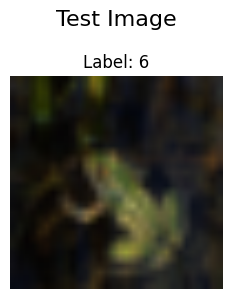

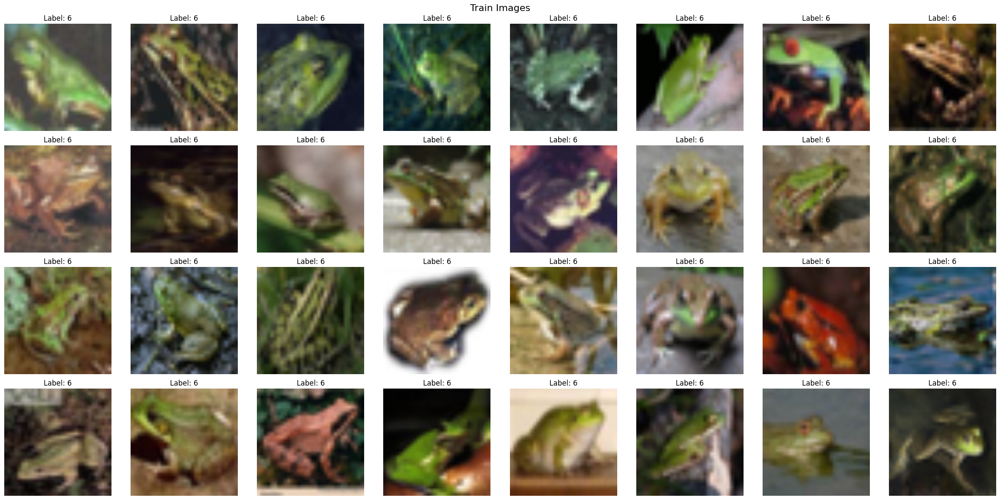

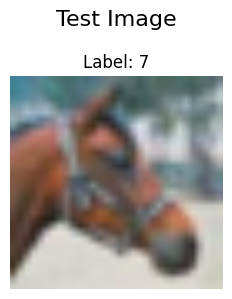

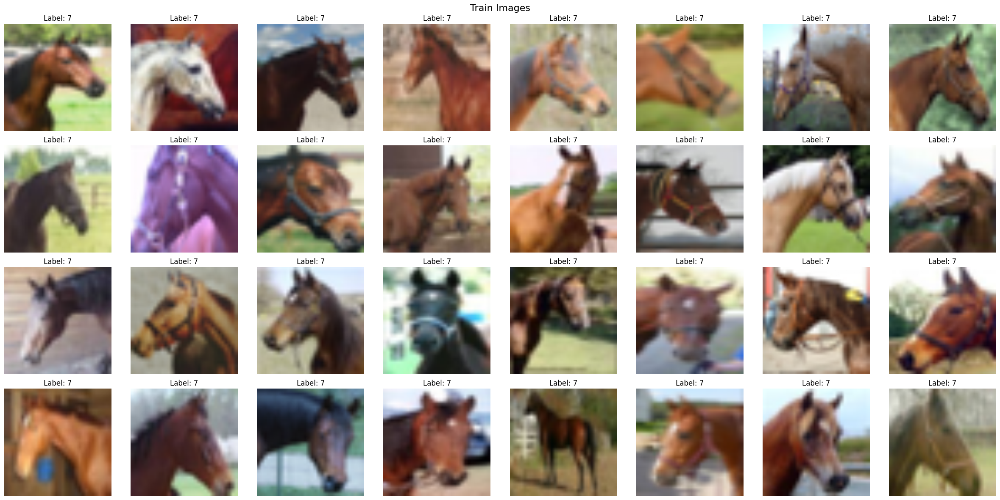

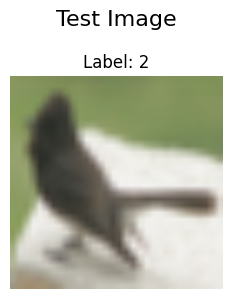

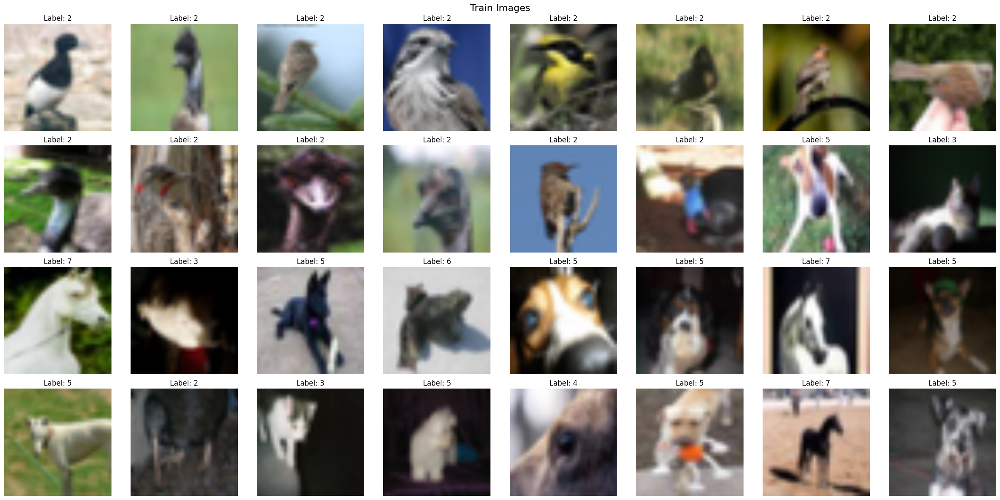

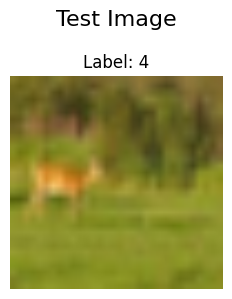

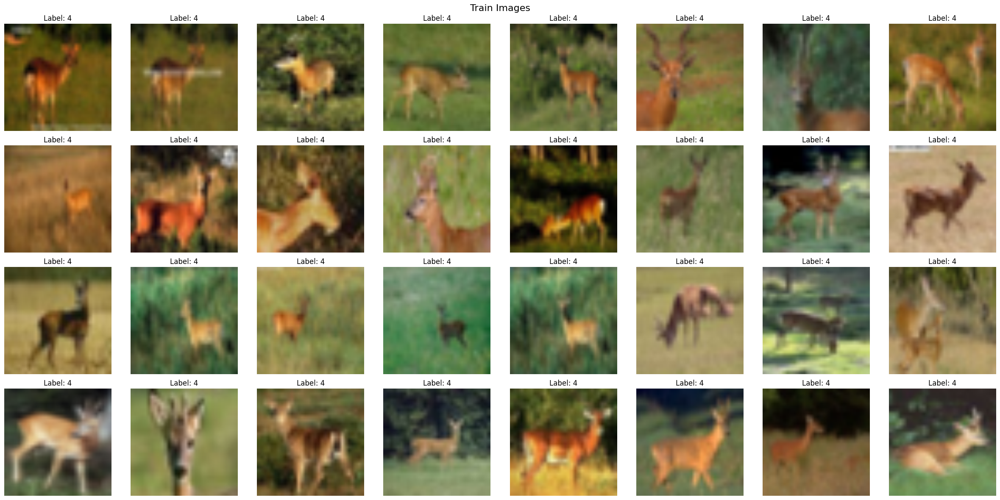

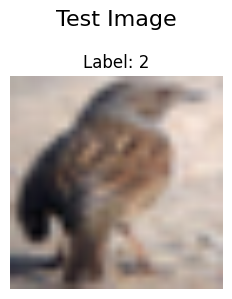

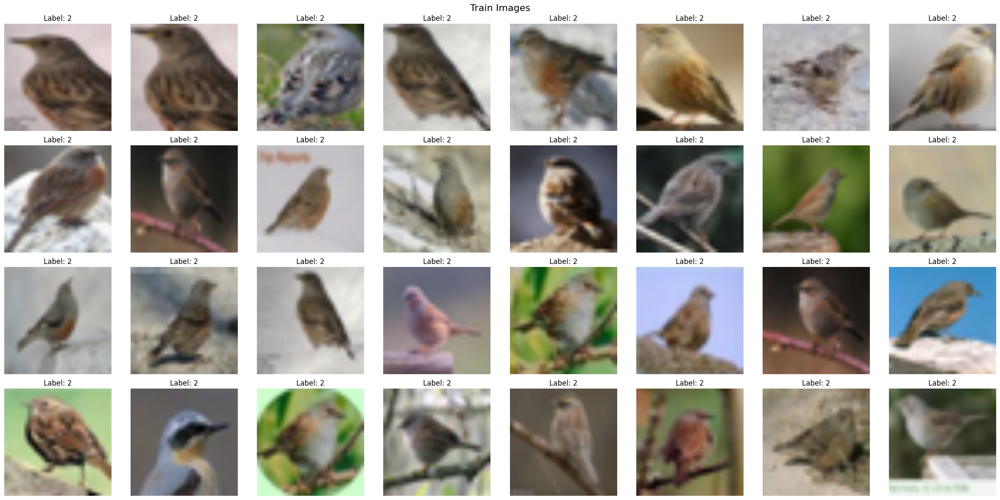

In [184]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms

transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to a consistent size
    transforms.ToTensor(),          # Convert PIL images to tensors
])

# Function to display images in a grid
def show_images_grid(images, labels, rows=3, cols=4, title=None):
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    if title:
        fig.suptitle(title, fontsize=16)
    
    # Flatten axes if it’s a 2D array; otherwise, wrap it in a list for consistency
    if rows == 1 and cols == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, (img, lbl) in enumerate(zip(images, labels)):
        if idx >= rows * cols:
            break
        ax = axes[idx]
        ax.imshow(img.permute(1, 2, 0))  # Convert CHW to HWC for display
        ax.set_title(f'Label: {lbl}')
        ax.axis('off')
    
    # Turn off any extra axes
    for ax in axes[len(images):]:
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()
    
random_choices = random.sample(range(0, len(ds_feature['test'])), 5)

# Get a batch of original images and labels
for c,(i, j) in enumerate(unique_images_dict.items()):
    top = sorted(j, key=lambda x: x[-1], reverse=True)[:32]
    if c in random_choices:
        test_image = transform(ds_feature['test'][i]['img'][0])
        test_label = ds_feature['test'][i]['label'][0]
        
        # Display the test image
        show_images_grid([test_image], [test_label], rows=1, cols=1, title='Test Image')
        
        # Get the train images and labels for the current test image
        train_images = [transform(ds_feature['train'][k]['img'][0]) for k in top]
        train_labels = [ds_feature['train'][k]['label'][0] for k in top]
        
        # Display the train images in a grid
        show_images_grid(train_images, train_labels, rows=4, cols=8, title='Train Images')
    
